### Importing libraries

In [54]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

import spacy
import scipy.io
import gc
from sklearn.preprocessing import LabelEncoder
import pickle

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Reshape
from tensorflow.keras import Input
from keras.layers.recurrent import LSTM
from keras.layers import concatenate
from keras.layers.merge import Concatenate
from tensorflow.keras.models import model_from_json, Model
from tensorflow.keras.utils import plot_model
from collections import defaultdict
import operator
from keras.utils import np_utils, generic_utils
from progressbar import Bar, ETA, Percentage, ProgressBar
from itertools import zip_longest
from tensorflow.keras.models import load_model

### Reading the text files that contains extracted questions and annotations

In [80]:
questions = open('Preprocessed data/ques.txt', 'rb').read().decode('utf-8').splitlines()
questions_len = open('Preprocessed data/ques_len.txt', 'rb').read().decode('utf-8').splitlines()
answers = open('Preprocessed data/answer.txt','rb').read().decode('utf-8').splitlines()
image_id = open('Preprocessed data/images_id.txt','rb').read().decode('utf-8').splitlines()
vgg_path = "vgg_feats.mat"

In [81]:
print(questions[201])
print(answers[201])
image_id[201]

What breeds of dog are represented in this image?
german shepherd and husky


'359569'

In [82]:
index_list=[]
for i in range(len(questions)):
    if len(answers[i])>20:
        index_list.append(i)
        print(i,questions[i],answers[i])

20 What is written on the teddy bear's feet? my 1st tatty teddy me to you
201 What breeds of dog are represented in this image? german shepherd and husky
798 What is she wearing? bikini top and shorts
1223 What are the street names? galley and wake forest
1316 Is the animal black with white stripes or white with black stripes? white with black stripes
1535 What vegetables are included in this medley? green beans, celery, broccoli, carrots, and cauliflower
1651 What do the street signs say? broadway, w 122, seminary row
1873 What are the street names in this photos? kalakaua and paoakalani
2312 What other electronics are on the table? ipad, laptop, and cell phone
2504 What two animals are photoshopped together? elephant and penguins
2549 What kind of pizza is this? tomato, mozzarella, and spinach
2680 What does the sign say below the Stop Sign? opposing traffic does not stop
4112 Where are the people in the picture? behind and beside skateboarder
4304 What color are on the umbrellas? re

76089 What color is the food? white, red, and yellowish brown
76356 Why is this a non-stop bus? for handicapped people
76508 What does GTAM stand for? general terrain american motorcycle
76518 What does the sign say? stop think observe proceed
76600 What types of food are in the photo? hot dog and tater tots
76710 What does the ribbon say? happy birthday charlotte
76846 What does it say on the top of the bus? stratford international
77457 What 3 vegetables are chopped up? carrots, celery, onions
77702 What streets are pictured? s roxbury and 51st ave s
78070 How is the man able to talk on the phone and use both hands to type? holding phone with shoulder
78421 What is this dog mixed with? pyrenees mountain dog
78648 What should be done according to the sign? look right before crossing
78688 What is the flat screen monitor on the desk displaying? month of craft photos
79200 What items are on the kitchen counter? cleaning supplies wine and toothbrushes
79450 What does the yellow sign say?

You can take any index and its corresponding question, answer and image id. Just Visit http://cocodataset.org/#explore and type image id. You will get the image. So by this way you can check questions about images ans its answers.

In [60]:
nlp = spacy.load("en_core_web_md")

In [190]:
!python -m spacy download en_core_web_md 

2022-12-09 19:13:27.383189: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2022-12-09 19:13:27.383189: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


In [61]:
vgg = scipy.io.loadmat(vgg_path)
features = vgg['feats']

Since we are creating a predictive model, we would not like to have all the words present in our vocabulary but the words which are more likely to occur or which are common. Hence we define upper limit as 1000 that is first 1000 most occuring words in vocabulary.

In [62]:
def freq_answers(questions, answers, image_id, upper_lim):
    freq_ans = defaultdict(int)
    for ans in answers:
        freq_ans[ans] +=1
    
    sort = sorted(freq_ans.items(), key=operator.itemgetter(1), reverse=True)[0:upper_lim]
    print(sort)
    top_ans, top_freq = zip(*sort)
    print(top_ans, top_freq)
    new_answers_train = list()
    new_questions_train = list()
    new_images_train = list()
    for ans, ques, img in zip(answers, questions, image_id):
        if ans in top_ans:
            new_answers_train.append(ans)
            new_questions_train.append(ques)
            new_images_train.append(img)
    return (new_questions_train, new_answers_train, new_images_train)

In [63]:
upper_lim = 1000
questions, answers, image_id = freq_answers(questions, answers, image_id, upper_lim)
questions_len, questions, answers, image_id = (list(t) for t in zip(*sorted(zip(questions_len, questions, answers, image_id))))
print (len(questions), len(answers),len(image_id))

[('yes', 27411), ('no', 18256), ('2', 3893), ('white', 2308), ('1', 2230), ('3', 2047), ('red', 1738), ('blue', 1660), ('green', 1322), ('4', 1301), ('black', 1192), ('yellow', 937), ('brown', 824), ('5', 684), ('tennis', 566), ('6', 552), ('orange', 517), ('left', 492), ('right', 469), ('baseball', 460), ('bathroom', 460), ('0', 437), ('pizza', 416), ('gray', 397), ('frisbee', 396), ('wood', 393), ('pink', 365), ('black and white', 352), ('8', 308), ('cat', 298), ('kitchen', 280), ('7', 267), ('skiing', 260), ('water', 247), ('man', 247), ('surfing', 246), ('dog', 246), ('grass', 244), ('skateboarding', 238), ('snow', 236), ('skateboard', 214), ('broccoli', 209), ('10', 208), ('wii', 207), ('surfboard', 200), ('train', 197), ('kite', 189), ('winter', 184), ('purple', 183), ('horse', 178), ('phone', 178), ('giraffe', 178), ('motorcycle', 173), ('stop', 169), ('umbrella', 165), ('apple', 161), ('elephant', 160), ('woman', 155), ('sheep', 154), ('brick', 152), ('food', 149), ('silver', 1

105175 105175 105175


In [64]:
le = LabelEncoder()
le.fit(answers)
pickle.dump(le, open('Preprocessed Data/label_encoder_lstm.pkl','wb'))

### Defining model parameters

In [65]:
batch_size               =      512
img_dim                  =     4096
word2vec_dim             =      300
num_hidden_nodes_mlp     =     1024
num_hidden_nodes_lstm    =      512
num_layers_lstm          =        3
dropout                  =       0.5
activation_mlp           =     'tanh'
num_epochs = 1

In [66]:
img_ids = open('Preprocessed data/coco_vgg_IDMap.txt','rb').read().decode('utf-8').splitlines()
id_map = dict()
for ids in img_ids:
    id_split = ids.split()
    id_map[id_split[0]] = int(id_split[1])
    #print(id_map)

### Defining network architecture

In [67]:
image_model = Sequential()
image_model.add(Reshape(input_shape = (4096,), target_shape=(4096,)))
model1 = Model(inputs = image_model.input, outputs = image_model.output)
model1.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
reshape_1_input (InputLayer) [(None, 4096)]            0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 4096)              0         
Total params: 0
Trainable params: 0
Non-trainable params: 0
_________________________________________________________________


In [68]:
language_model = Sequential()
language_model.add(LSTM(units=num_hidden_nodes_lstm, 
                        return_sequences=True, input_shape=(None, word2vec_dim)))

for i in range(num_layers_lstm-2):
    language_model.add(LSTM(units=num_hidden_nodes_lstm, return_sequences=True))
language_model.add(LSTM(units=num_hidden_nodes_lstm, return_sequences=False))

model2 = Model(language_model.input, language_model.output)
model2.summary()

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_3_input (InputLayer)    [(None, None, 300)]       0         
_________________________________________________________________
lstm_3 (LSTM)                (None, None, 512)         1665024   
_________________________________________________________________
lstm_4 (LSTM)                (None, None, 512)         2099200   
_________________________________________________________________
lstm_5 (LSTM)                (None, 512)               2099200   
Total params: 5,863,424
Trainable params: 5,863,424
Non-trainable params: 0
_________________________________________________________________


In [69]:
combined = concatenate([image_model.output, language_model.output])

In [70]:
model = Dense(num_hidden_nodes_mlp, kernel_initializer='uniform', activation = 'tanh')(combined)
#model = Activation('tanh')(model)
model = Dropout(0.5)(model)

model = Dense(num_hidden_nodes_mlp, kernel_initializer='uniform', activation = 'tanh')(model)
#model = Activation('tanh')(model)
model = Dropout(0.5)(model)

model = Dense(num_hidden_nodes_mlp, kernel_initializer='uniform', activation = 'tanh')(model)
#model = Activation('tanh')(model)
model = Dropout(0.5)(model)

model = Dense(upper_lim)(model)
model = Activation("softmax")(model)

model = Model(inputs=[image_model.input, language_model.input], outputs=model)

In [71]:
model.compile(loss='categorical_crossentropy', optimizer='rmsprop')
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
lstm_3_input (InputLayer)       [(None, None, 300)]  0                                            
__________________________________________________________________________________________________
lstm_3 (LSTM)                   (None, None, 512)    1665024     lstm_3_input[0][0]               
__________________________________________________________________________________________________
reshape_1_input (InputLayer)    [(None, 4096)]       0                                            
__________________________________________________________________________________________________
lstm_4 (LSTM)                   (None, None, 512)    2099200     lstm_3[0][0]                     
____________________________________________________________________________________________

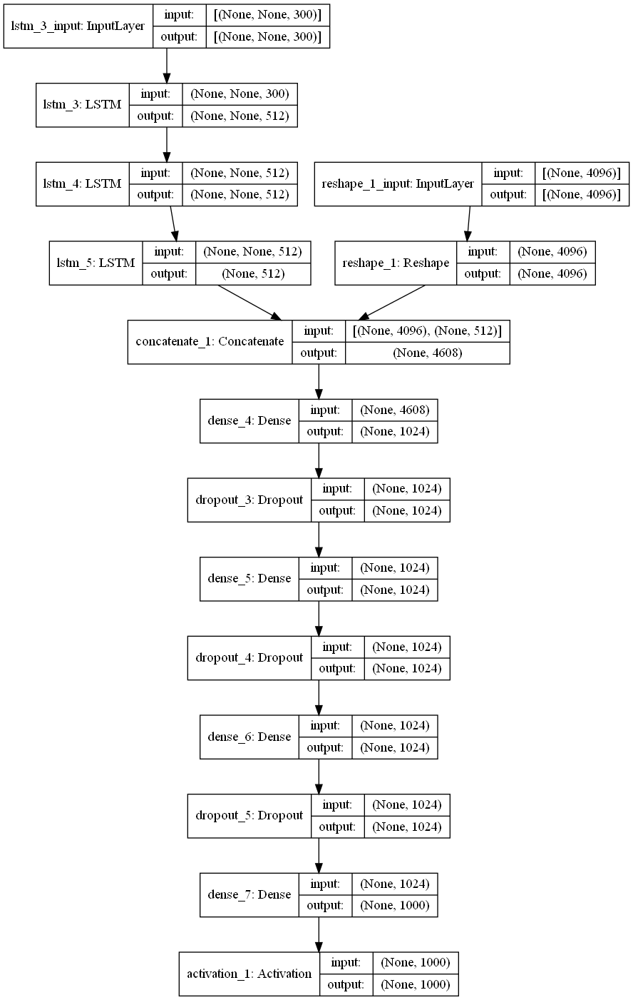

In [72]:
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [73]:
def get_questions_tensor_timeseries(questions, nlp, timesteps):
    assert not isinstance(questions, list)
    print(timesteps)
    nb_samples = len(questions)
    word_vec_dim = nlp(questions[0])[0].vector.shape[0]
    questions_tensor = np.zeros((nb_samples, timesteps, word_vec_dim))
    for i in range(len(questions)):
        tokens = nlp(questions[i])
        for j in range(len(tokens)):
            if j<timesteps:
                questions_tensor[i,j,:] = tokens[j].vector
    return questions_tensor

def get_images_matrix(img_coco_ids, img_map, VGGfeatures):
    assert not isinstance(img_coco_ids, list)
    nb_samples = len(img_coco_ids)
    nb_dimensions = VGGfeatures.shape[0]
    image_matrix = np.zeros((nb_samples, nb_dimensions))
    for j in range(len(img_coco_ids)):
        image_matrix[j,:] = VGGfeatures[:,img_map[img_coco_ids[j]]]

    return image_matrix

def get_answers_sum(answers, encoder):
    assert not isinstance(answers, list)
    y = encoder.transform(answers)
    nb_classes = encoder.classes_.shape[0]
    Y = np_utils.to_categorical(y, nb_classes)
    return Y

def grouped(iterable, n, fillvalue=None):
    args = [iter(iterable)] * n
   #print(args)
    #for a in(zip_longest(*args, fillvalue=fillvalue)):
        #print(a)
    return zip_longest(*args, fillvalue=fillvalue)

### Train-Test Split

In [205]:
train_questions = questions[:95000]
train_answers = answers[:95000]
train_image_id = image_id[:95000]

test_questions = questions[95000:]
test_answers = answers[95000:]
test_image_id = image_id[95000:]

In [206]:
model.compile(loss='categorical_crossentropy', optimizer='rmsprop')
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
lstm_6_input (InputLayer)       [(None, None, 300)]  0                                            
__________________________________________________________________________________________________
lstm_6 (LSTM)                   (None, None, 512)    1665024     lstm_6_input[0][0]               
__________________________________________________________________________________________________
reshape_1_input (InputLayer)    [(None, 4096)]       0                                            
__________________________________________________________________________________________________
lstm_7 (LSTM)                   (None, None, 512)    2099200     lstm_6[0][0]                     
____________________________________________________________________________________________

In [208]:
for k in range(num_epochs):
    print("Epoch Number: ",k+1)
    progbar = generic_utils.Progbar(len(train_questions))
    for question_batch, ans_batch, im_batch in zip(grouped(train_questions, batch_size, fillvalue=train_questions[-1]), 
                                               grouped(train_answers, batch_size, fillvalue=train_answers[-1]),
                                               grouped(train_image_id, batch_size, fillvalue=train_image_id[-1])):
        timestep = len(nlp(question_batch[-1]))
        X_ques_batch = get_questions_tensor_timeseries(question_batch, nlp, timestep)
        X_img_batch = get_images_matrix(im_batch, id_map, features)
        Y_batch = get_answers_sum(ans_batch, le)
        #print(X_img_batch.shape)
        loss = model.train_on_batch(({'lstm_6_input' : X_ques_batch, 'reshape_1_input' : X_img_batch}), Y_batch)
        progbar.add(batch_size, values=[('train loss', loss)])
        

Epoch Number:  1
9
95232/95000 [==============================] - 2798s 29ms/step - train loss: 4.3587


In [209]:
label_encoder = pickle.load(open('Preprocessed Data//label_encoder_lstm.pkl','rb'))

In [210]:
y_pred = []
batch_size = 512 

#print ("Word2Vec Loaded!") 

widgets = ['Evaluating ', Percentage(), ' ', Bar(marker='#',left='[',right=']'), ' ', ETA()]
pbar = ProgressBar(widgets=widgets)

In [213]:
for qu_batch,an_batch,im_batch in pbar(zip(grouped(test_questions, batch_size, 
                                                   fillvalue=test_questions[0]), 
                                           grouped(test_answers, batch_size, 
                                                   fillvalue=test_answers[0]), 
                                           grouped(test_image_id, batch_size, 
                                                   fillvalue=test_image_id[0]))):
    timesteps = len(nlp(qu_batch[-1]))
    X_ques_batch = get_questions_tensor_timeseries(qu_batch, nlp, timesteps)
    X_i_batch = get_images_matrix(im_batch, id_map, features)
    #X_batch = [X_ques_batch, X_i_batch]
    y_predict = model.predict(({'lstm_3_input' : X_ques_batch, 'reshape_1_input' : X_img_batch}))
    y_predict = np.argmax(y_predict,axis=1)
    y_pred.extend(label_encoder.inverse_transform(y_predict))

ValueError: cannot convert float NaN to integer

In [214]:
print(X_ques_batch.shape,X_img_batch.shape)

(512, 6, 300) (512, 4096)


In [215]:
X_ques_batch[0].shape

(6, 300)

In [216]:
model.get_weights()[0].shape

(300, 2048)

In [87]:
test_questions[0]

'Are they playing Cricket?'

In [88]:
test_image_id[0]

'339245'

In [89]:
test_answers[0]

'no'

In [90]:
y_pred[0]

'no'

In [219]:
#model.save("model.h5")
from tensorflow import keras
model = keras.models.load_model('model.h5')

In [220]:
y_predict = model.predict(({'lstm_3_input' : X_ques_batch, 'reshape_1_input' : X_img_batch}))
y_predict = np.argmax(y_predict,axis=1)

In [221]:
y_predict

array([572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572,
       572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 572, 57

In [222]:
y_pred.extend(label_encoder.inverse_transform(y_predict))

In [223]:
y_pred

['no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',
 'no',

In [224]:
correct_val = 0.0
total = 0


for pred, truth, ques, img in zip(y_pred, test_answers, test_questions, test_image_id):
    t_count = 0
    for _truth in truth.split(';'):
        if pred == truth:
            t_count += 1 
    if t_count >=1:
        correct_val +=1
    else:
        correct_val += float(t_count)/3

    total +=1

In [225]:
print ("Accuracy: ", round((correct_val/total)*100,2))

Accuracy:  34.38


In [ ]:
X_ques_batch_batch.shape

In [83]:
train_questions = [questions[i] for i in index_list[:30]]
train_questions

["What is written on the teddy bear's feet?",
 'What breeds of dog are represented in this image?',
 'What is she wearing?',
 'What are the street names?',
 'Is the animal black with white stripes or white with black stripes?',
 'What vegetables are included in this medley?',
 'What do the street signs say?',
 'What are the street names in this photos?',
 'What other electronics are on the table?',
 'What two animals are photoshopped together?',
 'What kind of pizza is this?',
 'What does the sign say below the Stop Sign?',
 'Where are the people in the picture?',
 'What color are on the umbrellas?',
 'What are the tools in the picture?',
 'Why is the dog running?',
 "What holidays do the bear's costumes represent?",
 'Why is the cat crouching?',
 'What is the name of the store?',
 'What kind of vegetables are in the bowl on the right?',
 'Why the celebration?',
 'What does the sign say?',
 "What does the man's shirt read?",
 'What is the name of the station?',
 'Why does the bird appe

In [84]:
train_questions = [questions[i] for i in index_list[:30]]
train_answers = [answers[i] for i in index_list[:30]]
train_image_id = [image_id[i] for i in index_list[:30]]

test_questions = [questions[i] for i in index_list[30:60]]
test_answers = [answers[i] for i in index_list[30:60]]
test_image_id = [image_id[i] for i in index_list[30:60]]

In [85]:
print(train_image_id)

['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']


In [89]:
import cv2


In [90]:
print(train_image_id)

['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']


124039
(358, 500, 3)


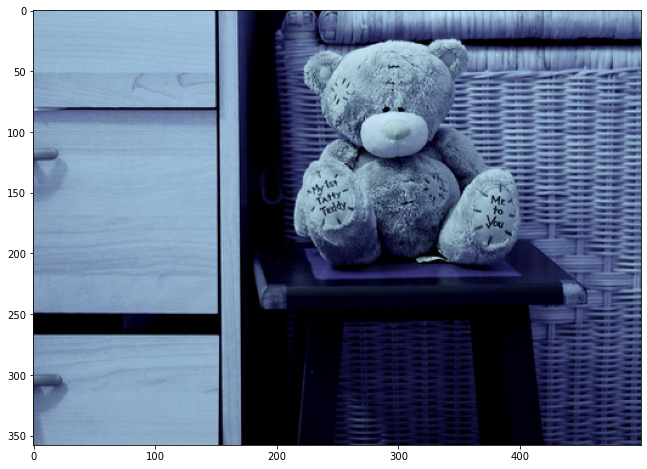

359569
(480, 640, 3)


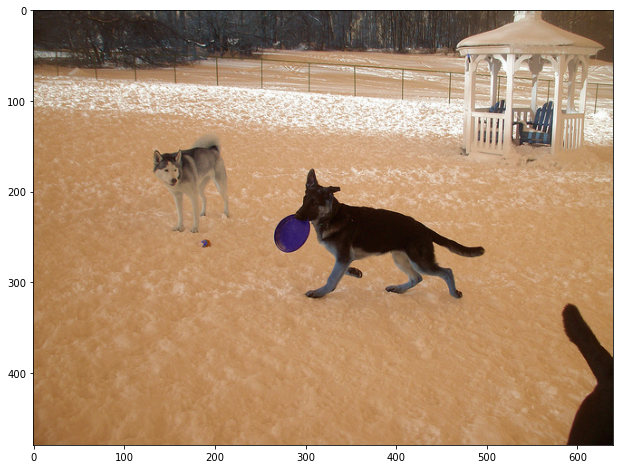

355660
(427, 640, 3)


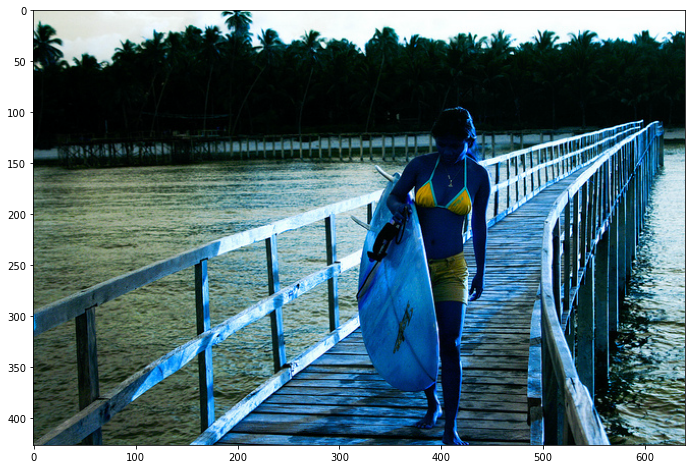

37339
105670
(640, 415, 3)


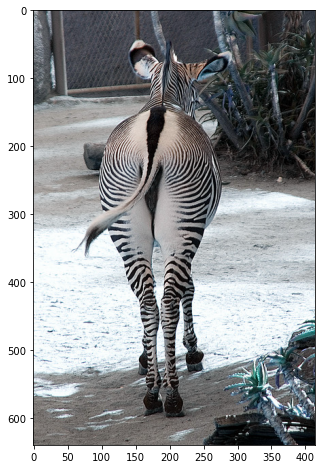

4936
500826
(426, 640, 3)


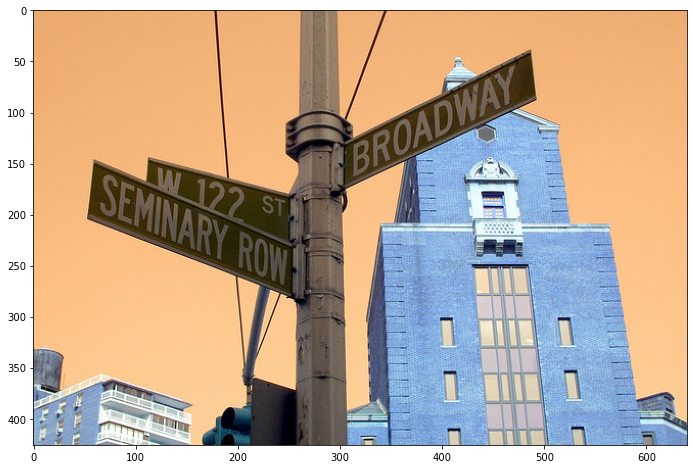

547903
(480, 640, 3)


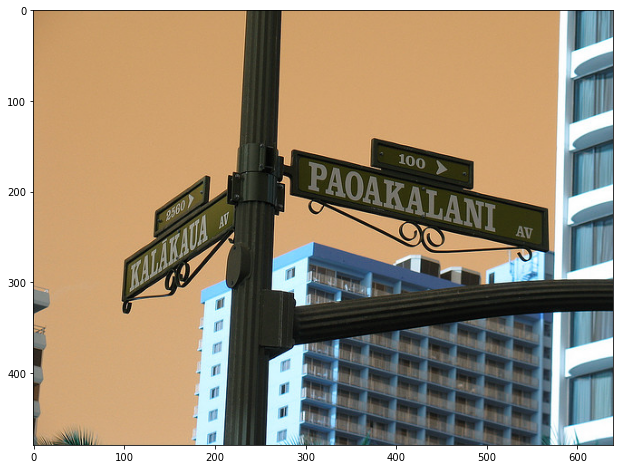

506803
(480, 640, 3)


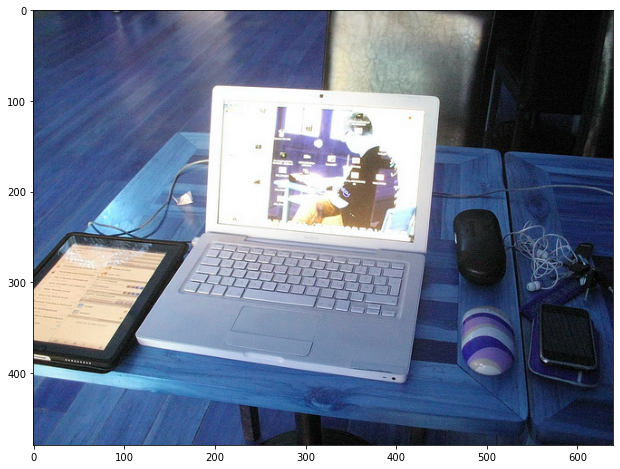

505530
(435, 640, 3)


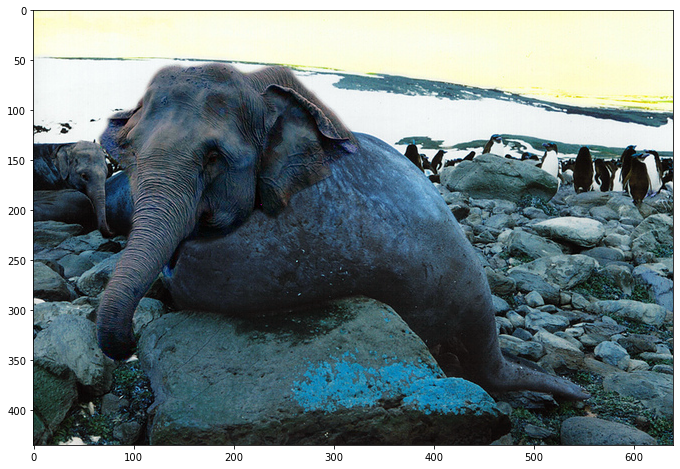

81251
67956
209904
(480, 640, 3)


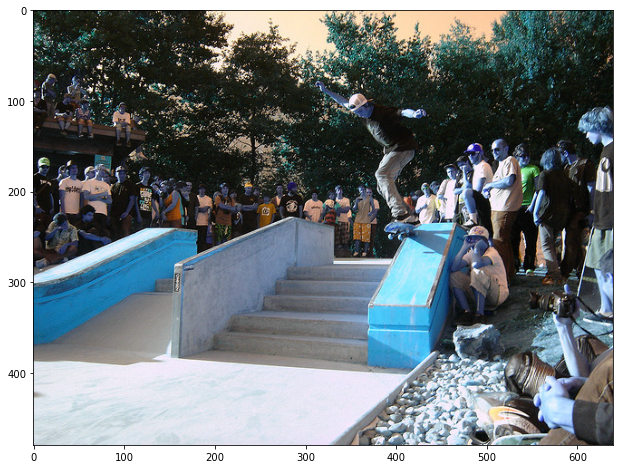

73702
424668
(480, 640, 3)


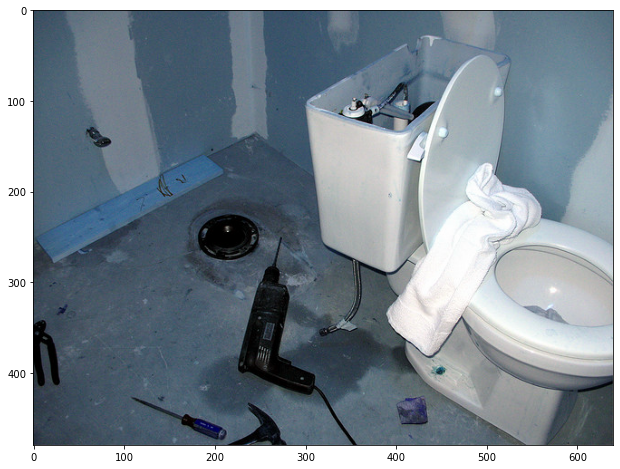

115912
(399, 640, 3)


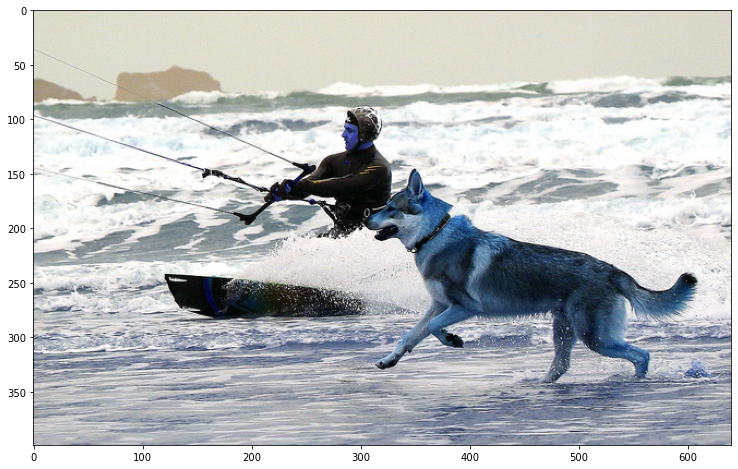

475330
(333, 500, 3)


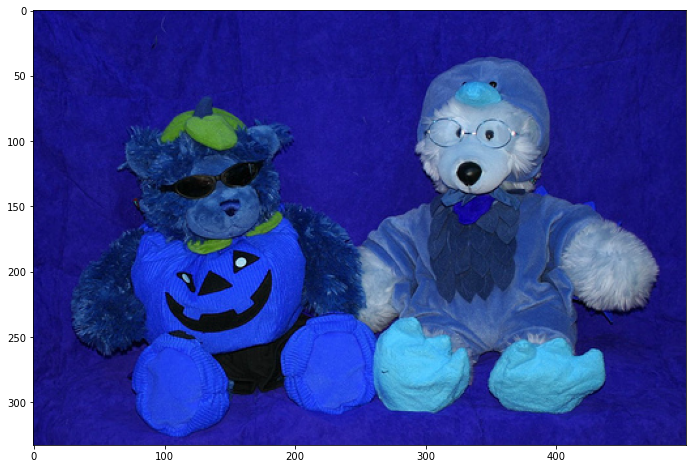

104494
(459, 640, 3)


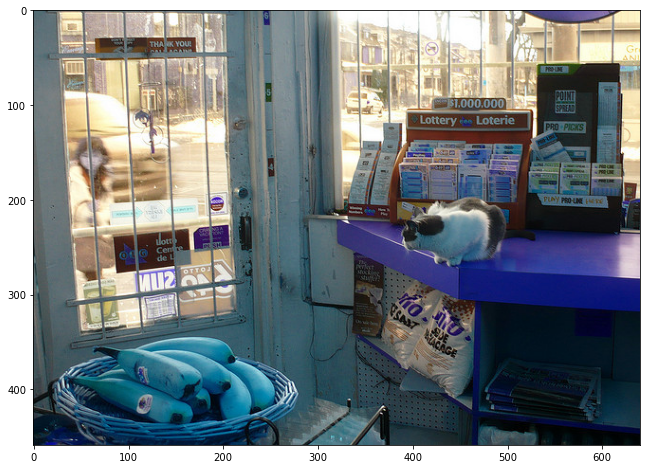

207634
(640, 480, 3)


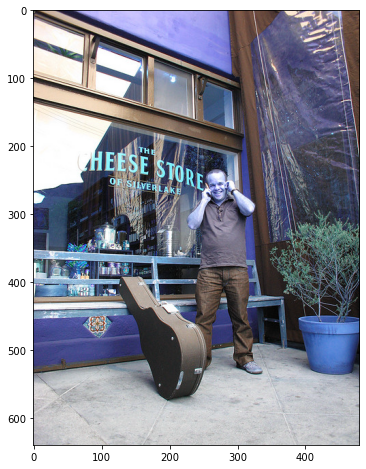

475248
(480, 640, 3)


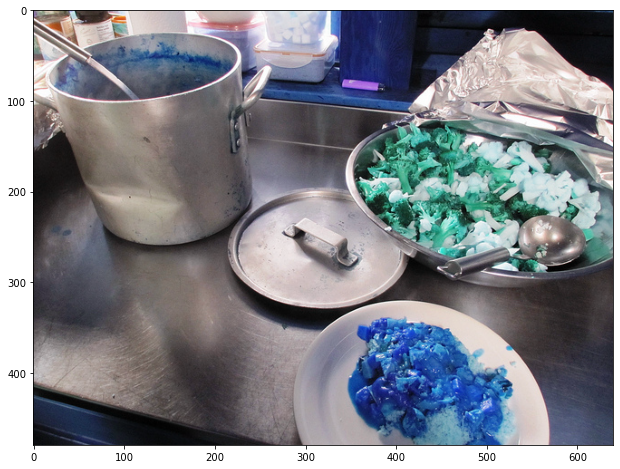

41128
37322
112581
(480, 640, 3)


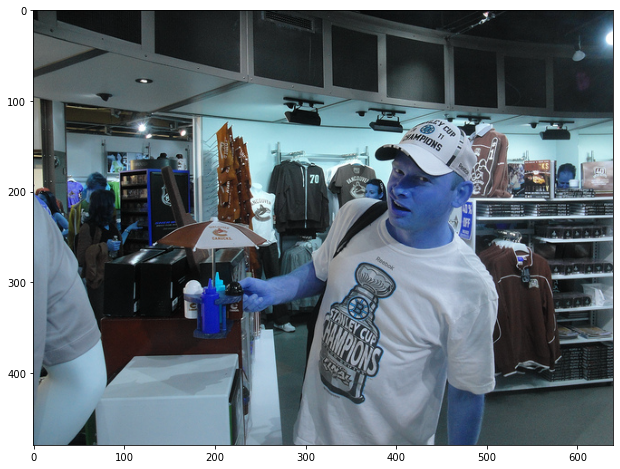

127984
(640, 480, 3)


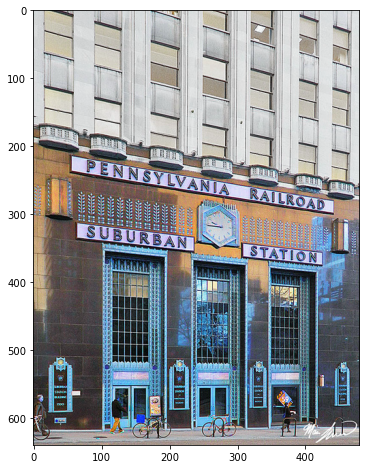

69805
24601
226111
(640, 480, 3)


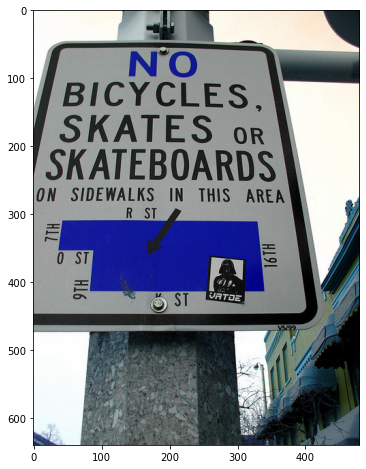

179322
(480, 640, 3)


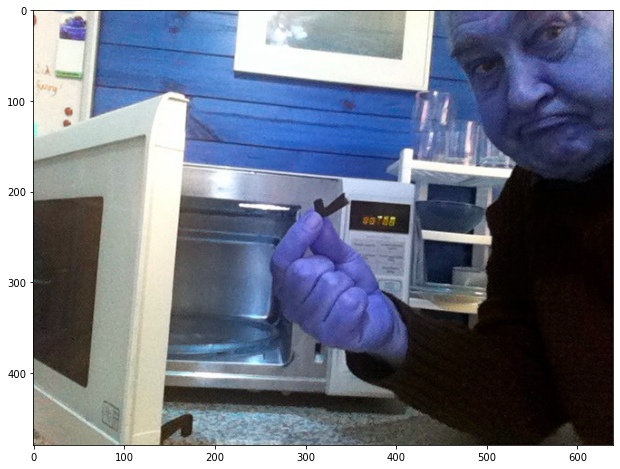

426453
(427, 640, 3)


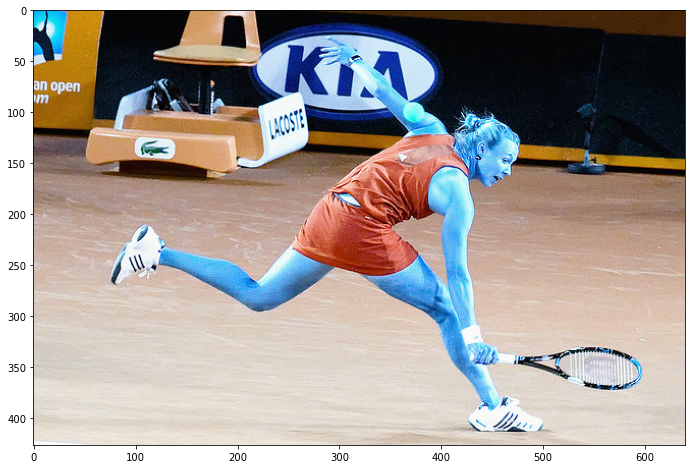

497514
(640, 480, 3)


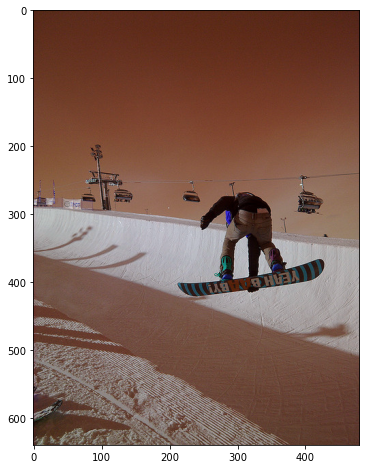

In [92]:
for i in train_image_id:
    try:
        print(i)
        path="val2014/val2014/COCO_val2014_000000"+str(i)+".jpg"
        image = cv2.imread(path)
        print(image.shape)
        plt.figure(figsize=(20,8))
        plt.imshow(image)
        plt.show()
    except Exception as e:
        continue

['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']
("What is written on the teddy bear's feet?",)
10
1
300
(1, 10, 300)
('my 1st tatty teddy me to you',)
7
('my 1st tatty teddy me to you',)
1
300
(1, 7, 300)
0
1
2
3
4
5
6
7
8
9
['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']
('What breeds of dog are represented in this image?',)
10
1
300
(1, 10, 300)
('german shepherd and husky',)
4
('german shepherd and husky',)
1
300
(1, 4, 300)
0
1
2
3
4
5
6
7
8
9
['124039', '359569', '355660', '37339', '105670', '4936', '500

['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']
('What is the name of the store?',)
8
1
300
(1, 8, 300)
('cheese store of silver lake',)
5
('cheese store of silver lake',)
1
300
(1, 5, 300)
0
1
2
3
4
5
6
7
['124039', '359569', '355660', '37339', '105670', '4936', '500826', '547903', '506803', '505530', '81251', '67956', '209904', '73702', '424668', '115912', '475330', '104494', '207634', '475248', '41128', '37322', '112581', '127984', '69805', '24601', '226111', '179322', '426453', '497514']
('What kind of vegetables are in the bowl on the right?',)
12
1
300
(1, 12, 300)
('broccoli and cauliflower',)
3
('broccoli and cauliflower',)
1
300
(1, 3, 300)
0
1
2
3
4
5
6
7
8
9
10
11
['124039', '359569', '355660', '37339', '105670', '4936', '500826', '5479

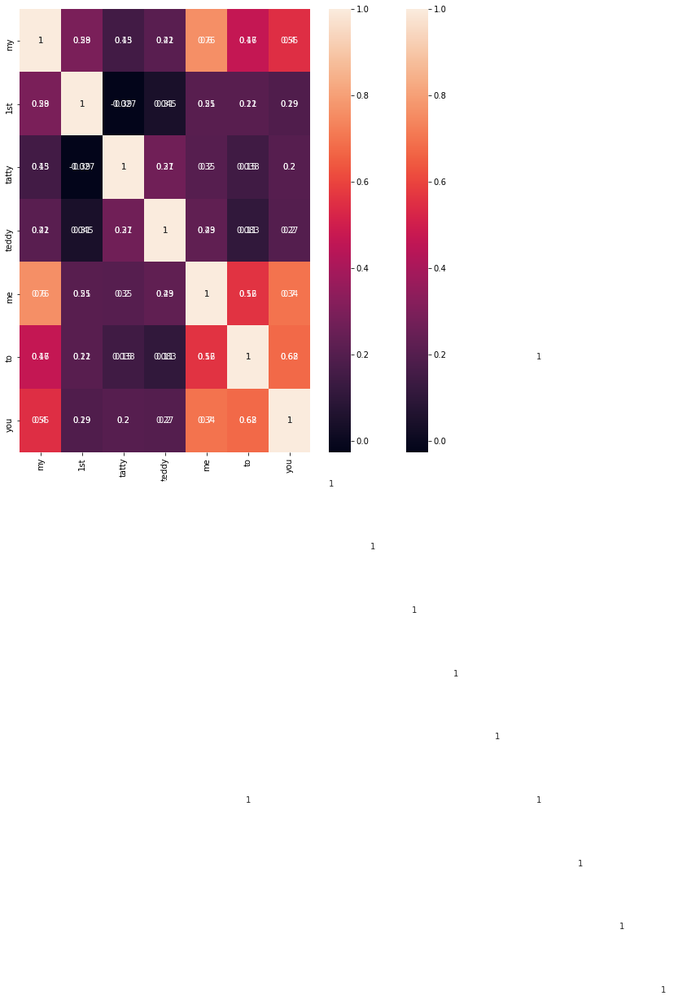

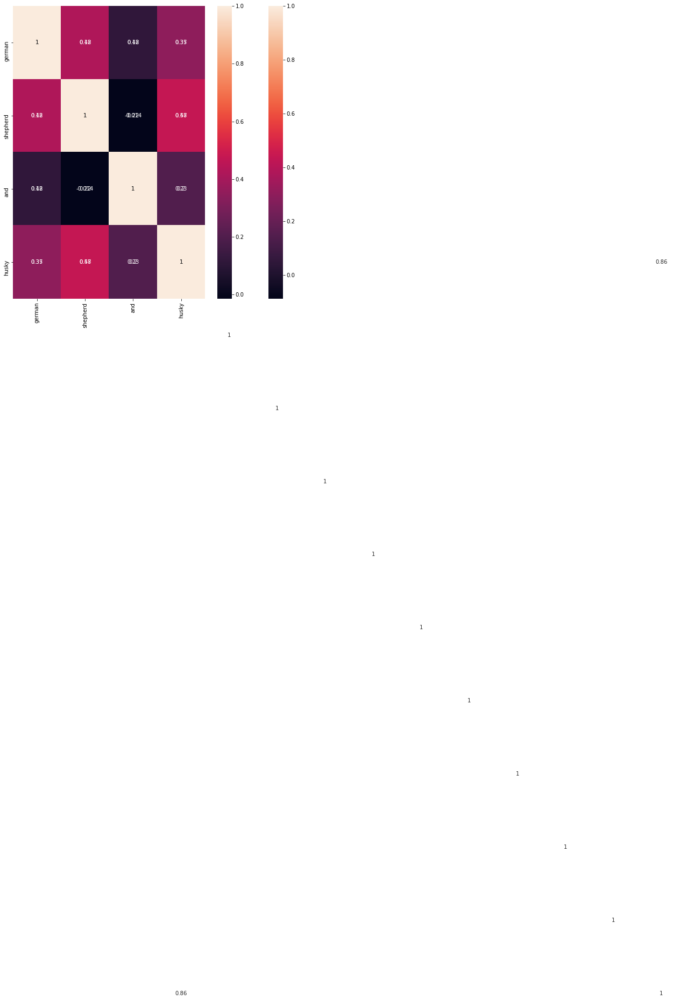

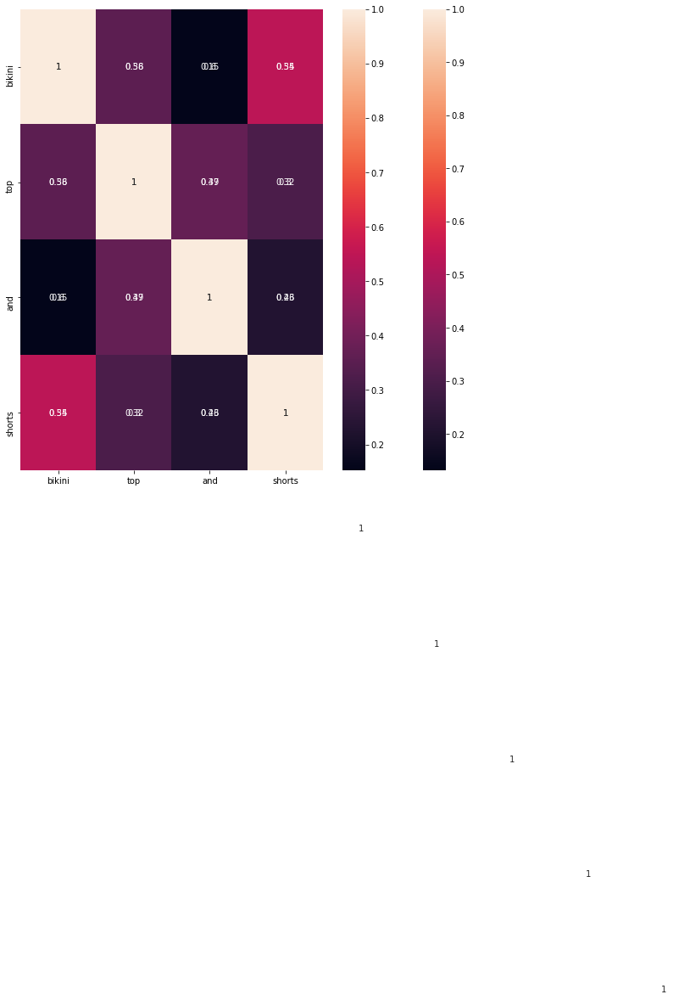

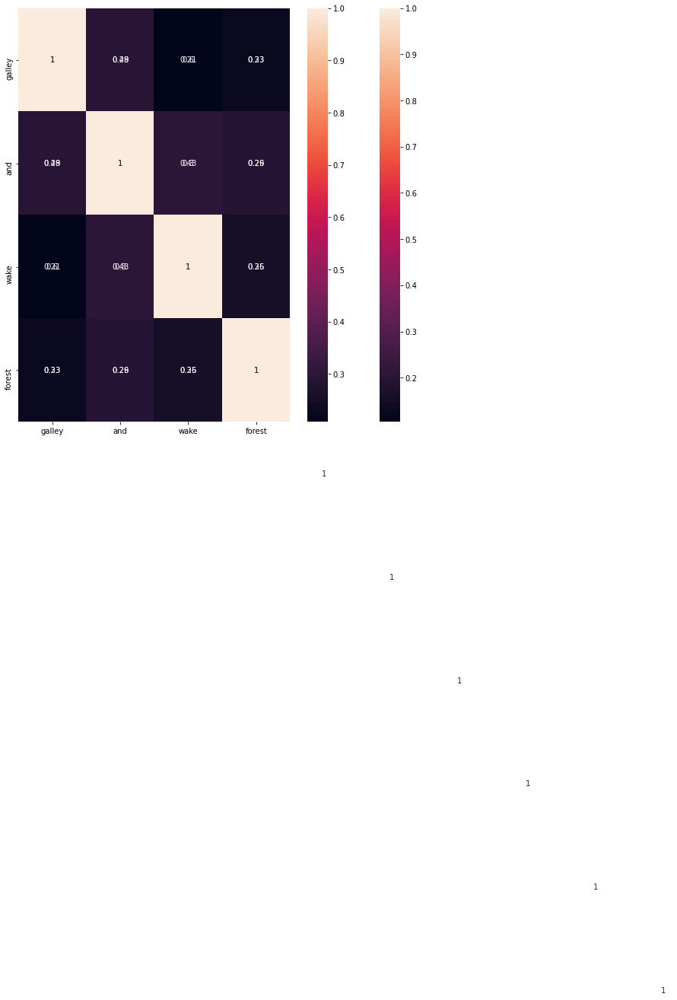

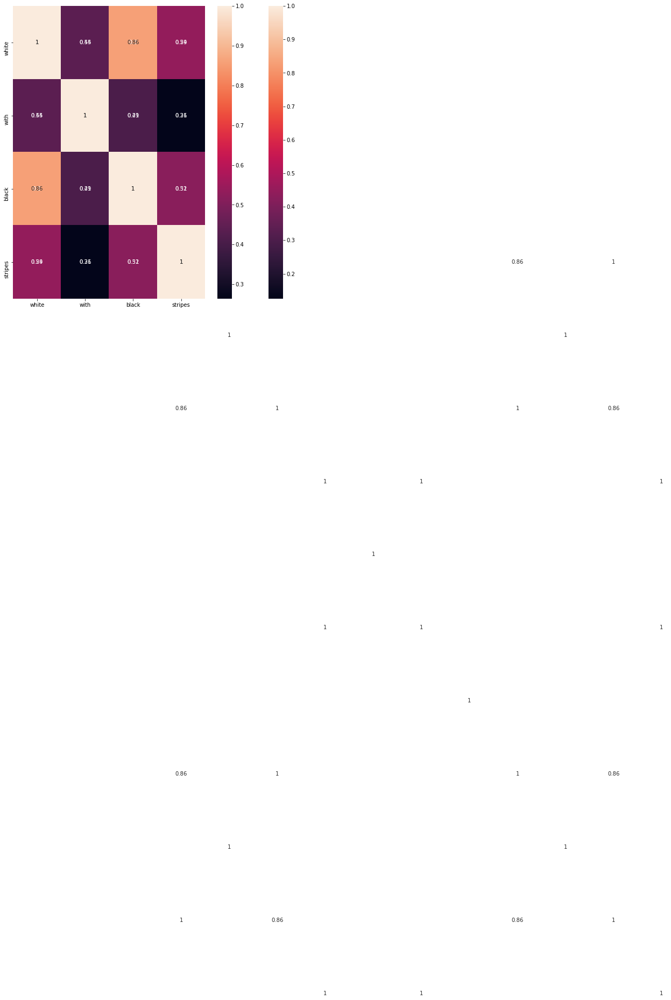

...

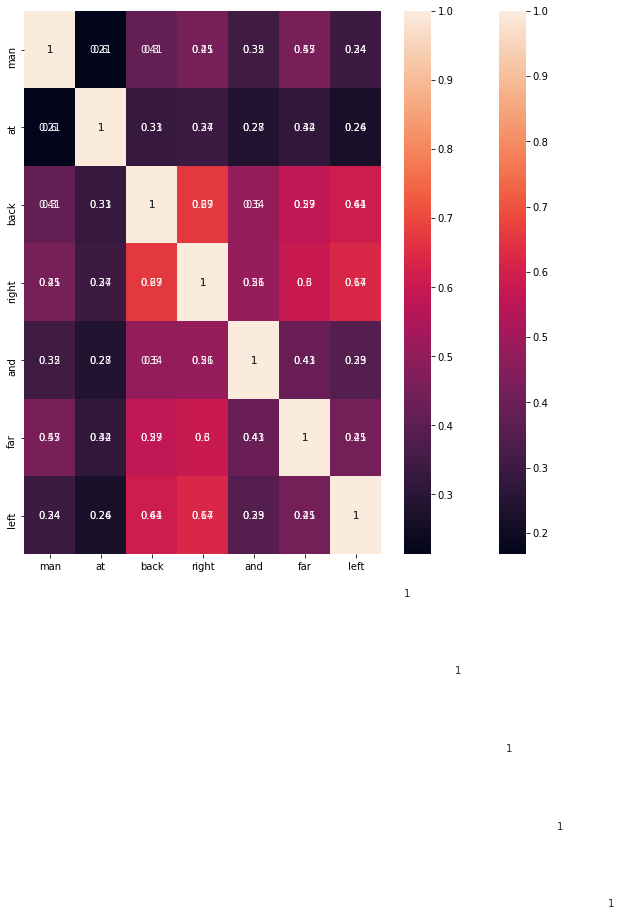

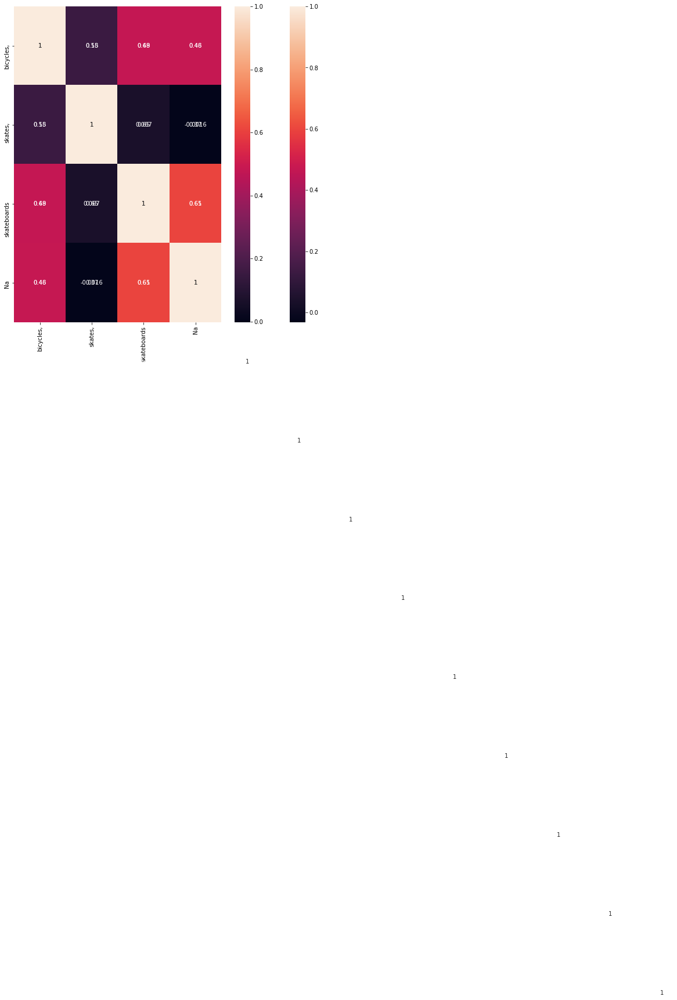

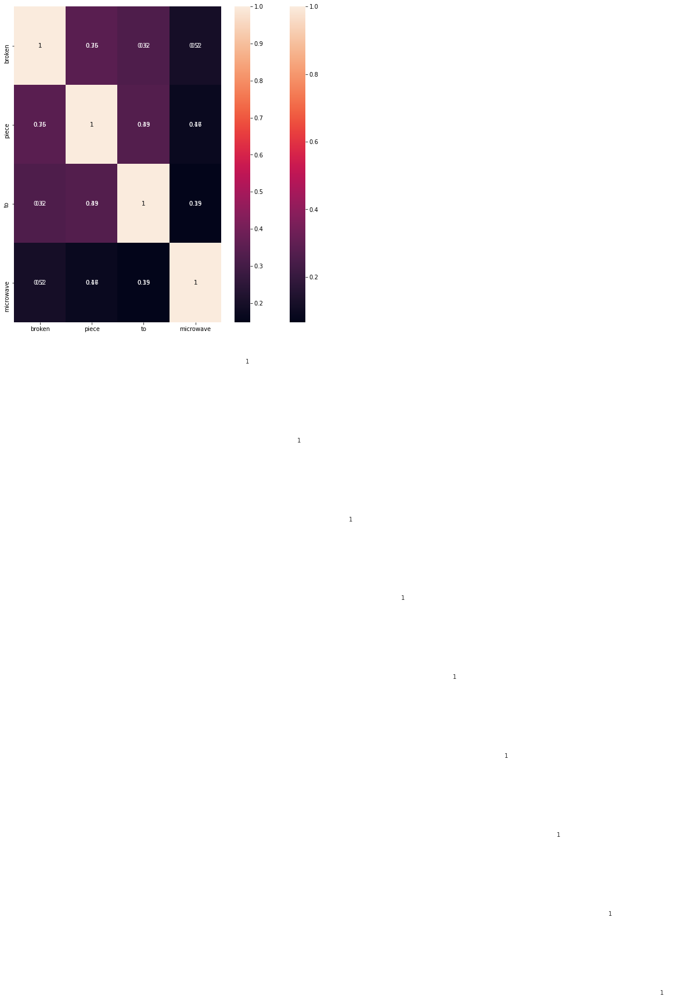

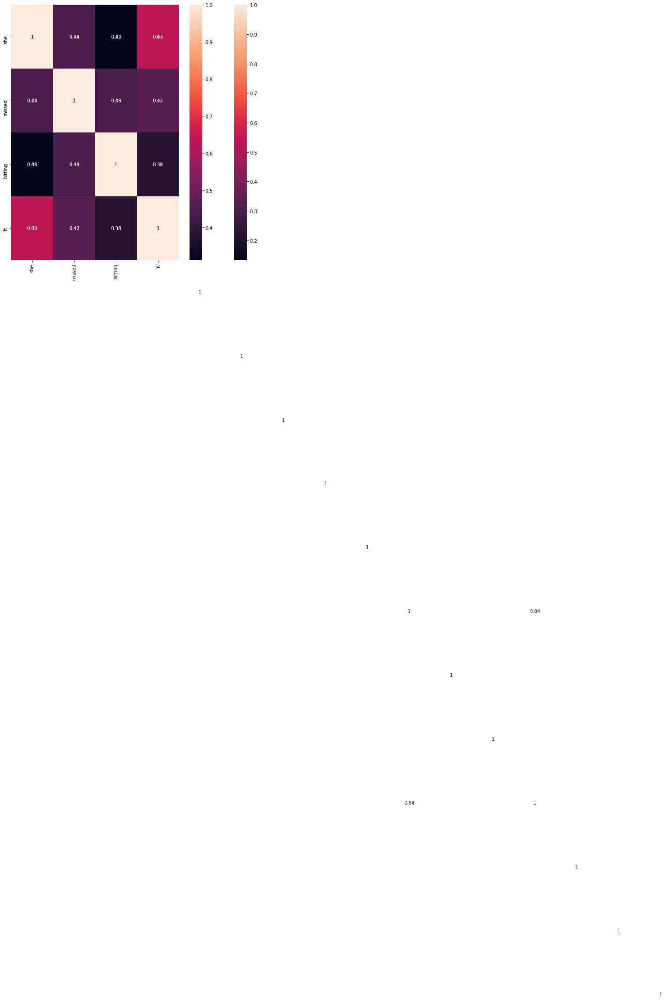

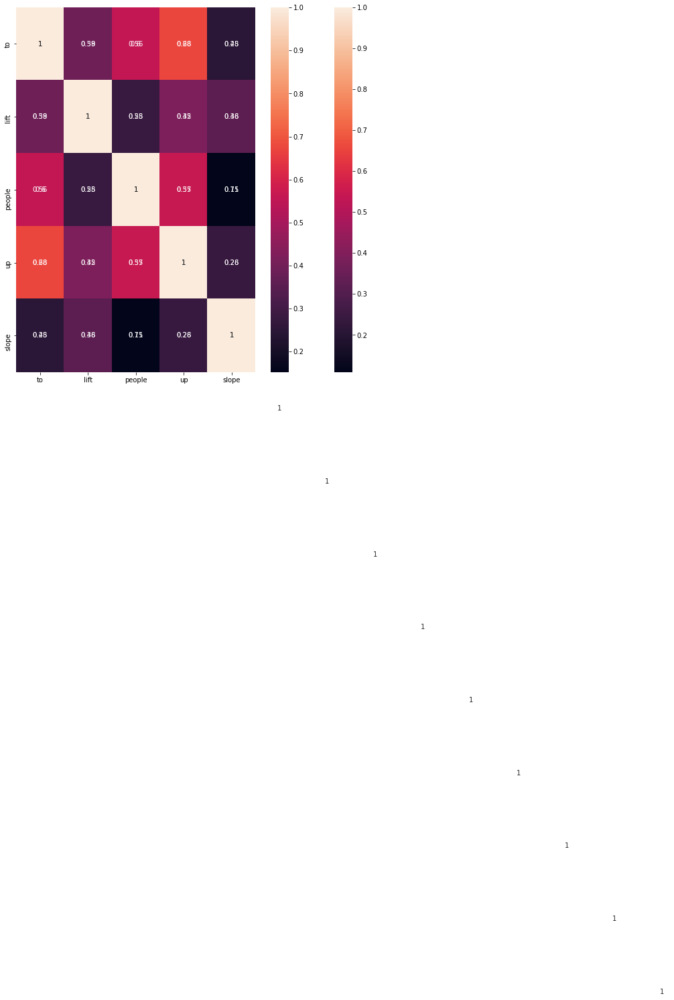

In [86]:
def get_questions_tensor_timeseries(questions, nlp, timesteps):
    assert not isinstance(questions, list)
    print(questions)
    print(timesteps)
    nb_samples = len(questions)
    print(nb_samples)
    word_vec_dim = nlp(questions[0])[0].vector.shape[0]
    print(word_vec_dim)
    questions_tensor = np.zeros((nb_samples, timesteps, word_vec_dim))
    for i in range(len(questions)):
        tokens = nlp(questions[i])
        for j in range(len(tokens)):
            if j<timesteps:
                questions_tensor[i,j,:] = tokens[j].vector
    print(questions_tensor.shape)
    
    return questions_tensor



def get_answers_tensor_timeseries(answers, nlp, timesteps):
    assert not isinstance(answers, list)
    print(answers)
    print(timesteps)
    nb_samples = len(answers)
    print(nb_samples)
    word_vec_dim = nlp(answers[0])[0].vector.shape[0]
    print(word_vec_dim)
    answers_tensor = np.zeros((nb_samples, timesteps, word_vec_dim))
    for i in range(len(answers)):
        tokens = nlp(answers[i])
        for j in range(len(tokens)):
            if j<timesteps:
                answers_tensor[i,j,:] = tokens[j].vector
    print(answers_tensor.shape)
    
    return answers_tensor

for question_batch, ans_batch, im_batch in zip(grouped(train_questions, 1, fillvalue=train_questions[-1]), 
                                               grouped(train_answers, 1, fillvalue=train_answers[-1]),
                                               grouped(train_image_id, 1, fillvalue=train_image_id[-1])):
        print(train_image_id)
        timestep = len(nlp(question_batch[-1]))
        X_ques_batch = get_questions_tensor_timeseries(question_batch, nlp, timestep)
        timestep = len(nlp(ans_batch[-1]))
        #X_img_batch = get_images_matrix(im_batch, id_map, features)
        X_answ_batch = get_answers_tensor_timeseries(ans_batch, nlp, timestep)
        word_list=[i for i in str(ans_batch[0]).split(" ")]
        word_list

        final_list=[]

        for i in range(X_answ_batch.shape[1]):
            try:
                final_list.append([word_list[i],X_answ_batch[:,i,:].reshape(-1)])
                #print(i,X_answ_batch[:,i,:].reshape(-1))

            except Exception as e:
                final_list.append(["Na",X_answ_batch[:,i,:].reshape(-1)])
        df2=pd.DataFrame(dict(final_list))
        df2
        
        word_list1=[i for i in str(question_batch[0]).split(" ")]
        word_list1

        final_list1=[]

        for i in range(X_ques_batch.shape[1]):
            print(i)
            try:
                final_list1.append([word_list1[i],X_ques_batch[:,i,:].reshape(-1)])
            #print(i,X_answ_batch[:,i,:].reshape(-1))
            except Exception as e:
                final_list1.append(["Na",X_ques_batch[:,i,:].reshape(-1)])
                
        df1=pd.DataFrame(dict(final_list1))
        df1

        import matplotlib.pyplot as plt
        import seaborn as sns
        plt.figure(figsize=(10,10))
        sns.heatmap(pd.concat((df1,df2),axis=1).corr(),annot=True)

        import matplotlib.pyplot as plt
        import seaborn as sns
        sns.heatmap(df2.corr(),annot=True)


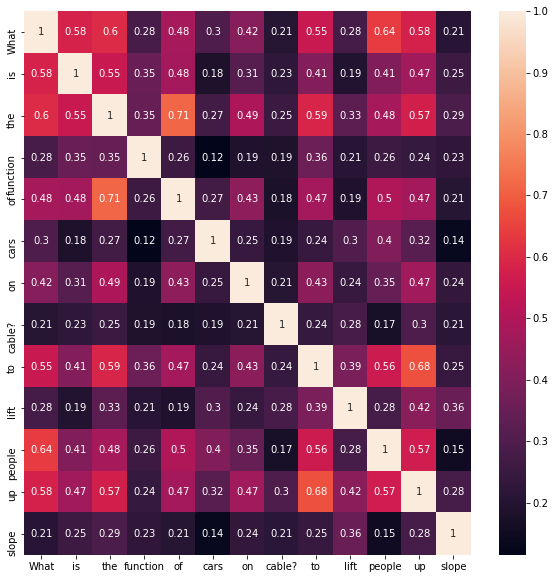

In [182]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10,10))
sns.heatmap(pd.concat((df1,df2),axis=1).corr(),annot=True)

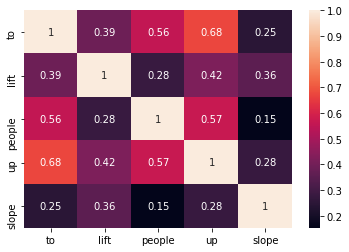

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.heatmap(df2.corr(),annot=True)